# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "simulation_complexloop_singlebatch"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Feb16-1538'

In [4]:
state_key = 'time'
batch_key = 'batch'
state_type = 'trajectory'
batch_type = 'batch_specific_features'
distribution = 'normal'
leiden_key = 'leiden_no_noise'

In [42]:
from Concord.utils.simulation import Simulation
# Create an instance of the Simulation class

sim = Simulation(n_cells=1000, n_genes=100, n_batches=1, n_states=3, 
                 state_type=state_type, 
                 state_distribution = distribution, 
                 state_level=10, 
                 state_min_level=0,
                 state_dispersion=5.0, 
                 program_structure='linear_bidirectional',
                 program_on_time_fraction=0.2,
                 trajectory_program_num=8,
                 trajectory_cell_block_size_ratio=0.2,
                 trajectory_loop_to=[1,3,5],
                 batch_distribution = distribution,
                 batch_type=batch_type, 
                 batch_level=[10,10], 
                 batch_dispersion=[5.0, 5.0], 
                 non_neg=True, to_int=True,
                 seed=42)

# Generate the simulated data
adata, adata_state = sim.simulate_data()

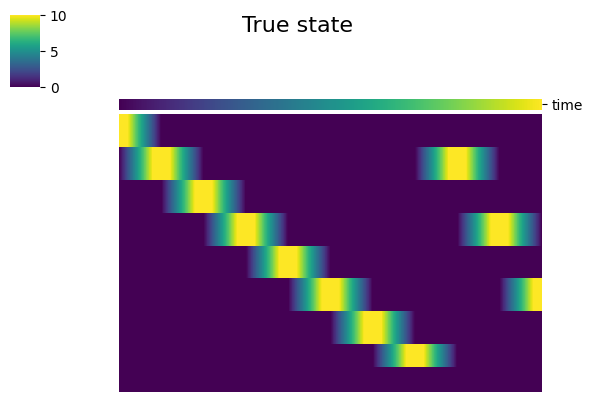

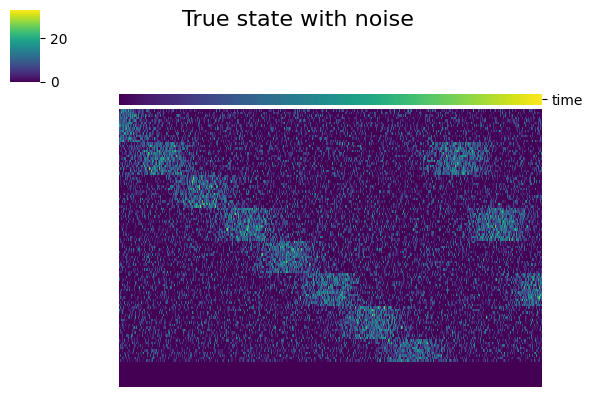

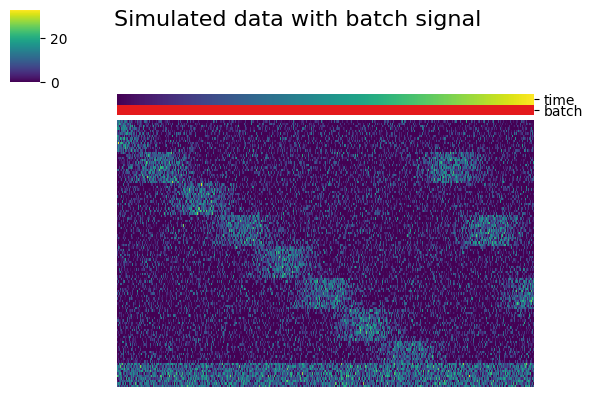

In [43]:
ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state', save_path=save_dir/f'true_state_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state with noise', save_path=save_dir/f'true_state_with_noise_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Simulated data with batch signal', save_path=save_dir/f'simulated_data_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)

In [44]:
adata.shape

(1000, 110)

### No batch effect, no noise

In [45]:
n_components = 15
ccd.ul.run_pca(adata, source_key='no_noise', result_key='PCA_no_noise', n_pc=n_components, random_state=seed)
ccd.ul.run_umap(adata, source_key='no_noise', result_key='UMAP_no_noise', random_state=seed)
sc.pp.neighbors(adata, use_rep='PCA_no_noise', n_neighbors=30, random_state=seed)
sc.tl.leiden(adata, resolution=1.0, key_added=leiden_key, random_state=seed)
#adata.obs[leiden_key] = adata_state.obs[leiden_key]

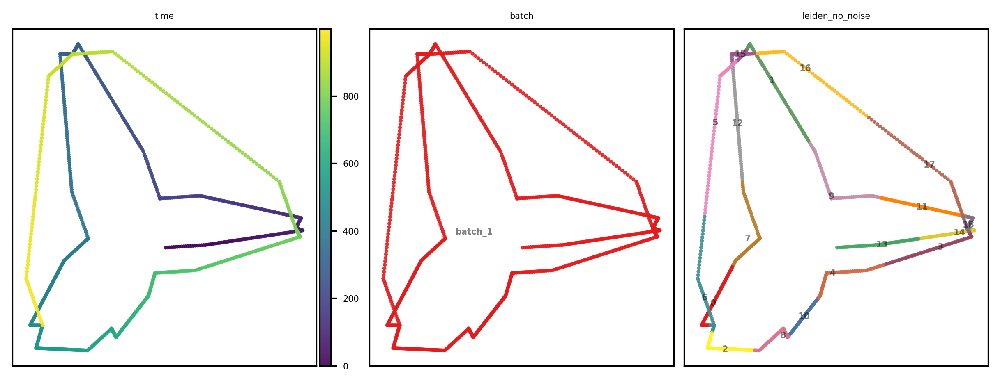

In [46]:
show_basis = 'PCA_no_noise'
show_cols = [state_key, batch_key, leiden_key]

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.svg"
)

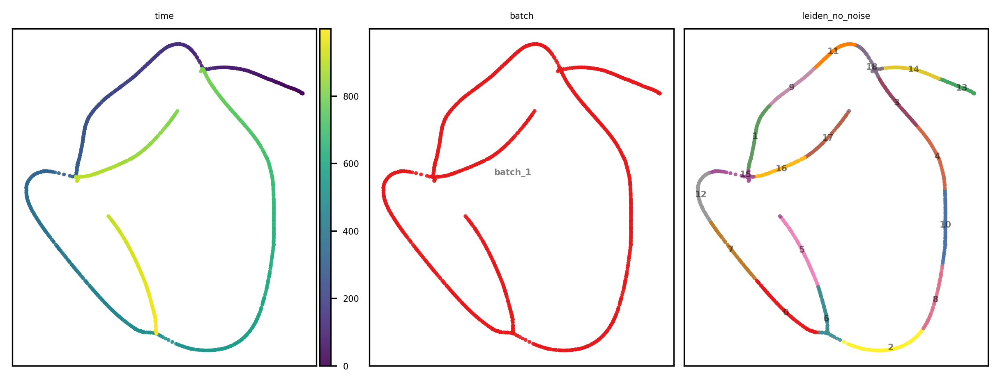

In [47]:
show_basis = 'UMAP_no_noise'

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.svg"
)

### noise added, Run all methods

In [7]:
run_methods = ["PCA", "UMAP", "t-SNE", "DiffusionMap", "NMF", 
             "FactorAnalysis", "FastICA", "LDA", "ZIFA", "scVI", "PHATE", 
             "Concord", "Concord-decoder", "Concord-pknn0"]
# exclude ["UMAP", "t-SNE"] from run_method, and save as combined_keys
exclude_keys = ["PCA", "UMAP", "t-SNE"]
combined_keys = ['no_noise', 'wt_noise'] + [key for key in run_methods if key not in exclude_keys]
combined_keys

['no_noise',
 'wt_noise',
 'DiffusionMap',
 'NMF',
 'FactorAnalysis',
 'FastICA',
 'LDA',
 'ZIFA',
 'scVI',
 'PHATE',
 'Concord',
 'Concord-decoder',
 'Concord-pknn0']

In [95]:
time_log = ccd.ul.run_dimensionality_reduction_pipeline(
    adata,
    source_key="X",
    methods=[ "Concord", "Concord-decoder", "Concord-pknn0"],
    n_components=30,
    random_state=seed,
    device=device,
    save_dir=save_dir,
    concord_epochs=30,
    concord_min_pid=0.95
)

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
Concord.model.dataloader - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
p_intra_knn: 0.2


Epoch 0 Training: 15it [00:00, 241.25it/s, loss=4.41]
Epoch 29 Training: 100%|██████████| 15/15 [00:00<00:00, 258.33it/s, loss=3.71]


Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
Concord.model.dataloader - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
p_intra_knn: 0.2


Epoch 0 Training: 15it [00:00, 183.97it/s, loss=22]
Epoch 29 Training: 100%|██████████| 15/15 [00:00<00:00, 194.62it/s, loss=15.6]


Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
Concord.model.dataloader - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
p_intra_knn: 0.0


Epoch 0 Training: 15it [00:00, 268.93it/s, loss=4.32]
Epoch 29 Training: 100%|██████████| 15/15 [00:00<00:00, 409.33it/s, loss=3.7]


KeyboardInterrupt: 

In [100]:
# Run umap and PCA for all latent embeddings
adata.obsm['no_noise'] = adata.layers['no_noise']
adata.obsm['wt_noise'] = adata.layers['wt_noise']
max_pc = 15
for basis in combined_keys:
    if basis not in adata.obsm.keys():
        continue
    print("Running UMAP and PCA for", basis)
    #if 'UMAP' not in basis:
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.7, metric='euclidean', random_state=seed)
    if not any(substring in basis for substring in ['PHATE', 'PCA']):
        if basis in adata.layers.keys():
            n_pc = min(min(adata.layers[basis].shape[1], adata.shape[0]) - 1, max_pc)
        else:
            n_pc = min(min(adata.obsm[basis].shape[1], adata.shape[0]) - 1, max_pc)
        
        ccd.ul.run_pca(adata, source_key=basis, result_key=f'{basis}_PCA', n_pc=n_pc, random_state=seed)


Running UMAP and PCA for no_noise
Running UMAP and PCA for wt_noise
Running UMAP and PCA for DiffusionMap
Running UMAP and PCA for NMF
Running UMAP and PCA for FactorAnalysis
Running UMAP and PCA for FastICA
Running UMAP and PCA for LDA
Running UMAP and PCA for ZIFA
Running UMAP and PCA for scVI
Running UMAP and PCA for PHATE
Running UMAP and PCA for Concord
Running UMAP and PCA for Concord-decoder
Running UMAP and PCA for Concord-pknn0


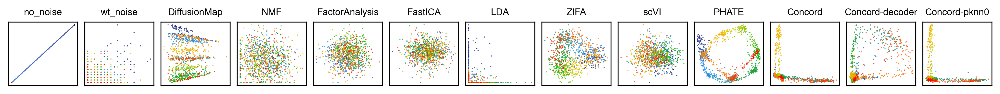

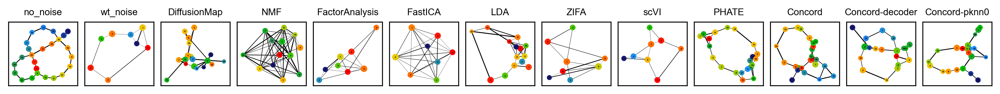

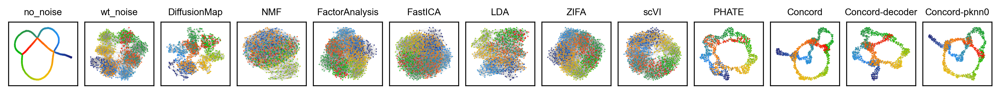

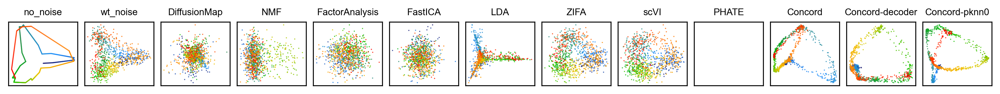

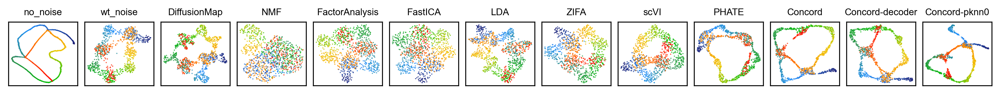

In [ ]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rcParams

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

color_bys = ['time']
basis_types = ['', 'PAGA', 'KNN', 'PCA', 'UMAP']

font_size=8
point_size=4
alpha=0.8
figsize=(0.9*len(combined_keys),1)
ncols = len(combined_keys)
nrows = 1
pal = {'time':'BlueGreenRed', 'batch':'Set1'}
k=10
edges_color='grey'
edges_width=0.05
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        combined_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        leiden_key='leiden',
        save_dir=save_dir,
        file_suffix=file_suffix,
        save_format='svg'
    )


In [83]:
# sort and smooth the signal along the path
batch_id=adata.obs['batch'].unique()[0]
batch_indices = np.where(adata.obs['batch'] == batch_id)[0]
_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord', path=batch_indices, sigma=2)
adata.obsm['Concord_sorted'] = adata.obsm['Concord'][:, feature_order]

_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord-decoder', path=batch_indices, sigma=2)
adata.obsm['Concord-decoder_sorted'] = adata.obsm['Concord-decoder'][:, feature_order]

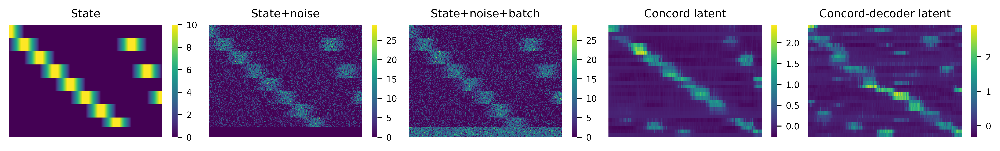

In [179]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
dpi = 600
fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord-decoder_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord-decoder latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
plt.tight_layout(w_pad=0.0, h_pad=0.1)
plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

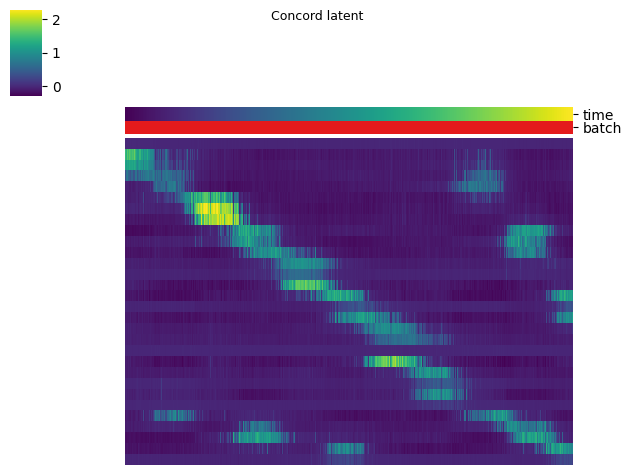

In [67]:
ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=True, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=f"heatmap_wt_annot_{file_suffix}.svg", figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)

In [68]:
import anndata as ad
import h5py
print(h5py.__version__)

3.12.1


In [91]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")
file_suffix

'Feb05-1924'

# Evaluation

In [5]:
# adata = sc.read(data_dir / f"adata_Dec15-0906.h5ad")
# adata_state = sc.read(data_dir / f"adata_state_Dec15-0906.h5ad")
adata = sc.read(data_dir / f"adata_Feb05-1924.h5ad")
adata_state = sc.read(data_dir / f"adata_state_Feb05-1924.h5ad")

### Topology

Run topological analysis pipeline:

In [6]:
run_methods = ["PCA", "UMAP", "t-SNE", "DiffusionMap", "NMF", 
             "FactorAnalysis", "FastICA", "LDA", "ZIFA", "scVI", "PHATE", 
             "Concord", "Concord-decoder", 'Concord-pknn0']
# exclude ["UMAP", "t-SNE"] from run_method, and save as combined_keys
exclude_keys = ["PCA", "UMAP", "t-SNE"]
combined_keys_topo = ['no_noise_PCA', 'wt_noise_PCA'] + [key for key in run_methods if key not in exclude_keys]
combined_keys_topo

['no_noise_PCA',
 'wt_noise_PCA',
 'DiffusionMap',
 'NMF',
 'FactorAnalysis',
 'FastICA',
 'LDA',
 'ZIFA',
 'scVI',
 'PHATE',
 'Concord',
 'Concord-decoder',
 'Concord-pknn0']

In [86]:
homology_dimensions = [0,1,2]
diagrams = {}
for key in combined_keys_topo:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for no_noise_PCA
Computing persistent homology for wt_noise_PCA
Computing persistent homology for DiffusionMap
Computing persistent homology for NMF
Computing persistent homology for FactorAnalysis
Computing persistent homology for FastICA
Computing persistent homology for LDA
Computing persistent homology for ZIFA
Computing persistent homology for scVI
Computing persistent homology for PHATE
Computing persistent homology for Concord
Computing persistent homology for Concord-decoder
Computing persistent homology for Concord-pknn0


In [73]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"


PosixPath('../save/dev_simulation_complexloop_singlebatch-Feb05/topology_diagrams_Feb05-1924.pkl')

In [8]:
import pickle
with open(Path('../save/dev_simulation_complexloop_singlebatch-Feb05/topology_diagrams_Feb05-1924.pkl'), 'rb') as f:
    diagrams = pickle.load(f)

In [9]:
expected_betti_numbers = [0,3,0]
max_betti = np.max(expected_betti_numbers)
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=expected_betti_numbers, save_dir=save_dir, file_suffix=file_suffix)
topology_metrics = topology_results['combined_metrics']#.drop(index=['no_noise_PCA', 'wt_noise_PCA'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=2 * max_betti)
topology_metrics

Betti curve               Betti number
                    Entropy      Variance  L1 distance
Method                                                
Concord            3.009553  19363.277900            0
Concord-decoder    3.266024  31150.970000            0
Concord-pknn0      2.953989  19584.861533            0
DiffusionMap       3.163316  33831.815733            4
FactorAnalysis     3.408383  67128.966500            6
FastICA            3.435405  63465.201267            6
LDA                3.771701  68806.280733            3
NMF                3.545557  72180.619833            6
PHATE              1.925845   7539.709833            2
ZIFA               3.398834  69971.896067            6
no_noise_PCA       2.062696   6125.566633            0
scVI               3.602407  73743.386867            6
wt_noise_PCA       3.608840  69657.061400            6

In [10]:
topology_df = topology_metrics.copy()

# Rename row name "no_noise_PCA" to "no_noise", "wt_noise_PCA" to "wt_noise"
topology_df.rename(
    index={
        "no_noise_PCA": "no_noise",
        "wt_noise_PCA": "wt_noise"
    },
    inplace=True
)

topology_df[("Topological metrics", "Betti curve stability")] = topology_df["Betti curve"][
    ["Entropy"]
]
topology_df[("Topological metrics", "Betti number accuracy")] = topology_df["Betti number"][
    ["L1 distance"]
]

topology_df.drop(
    columns=[
        ("Betti curve", "Variance"),
        ("Betti curve", "Entropy"),
        ("Betti number", "L1 distance")
    ],
    inplace=True
)

topology_df


Topological metrics                      
                Betti curve stability Betti number accuracy
Method                                                     
Concord                      3.009553                     0
Concord-decoder              3.266024                     0
Concord-pknn0                2.953989                     0
DiffusionMap                 3.163316                     4
FactorAnalysis               3.408383                     6
FastICA                      3.435405                     6
LDA                          3.771701                     3
NMF                          3.545557                     6
PHATE                        1.925845                     2
ZIFA                         3.398834                     6
no_noise                     2.062696                     0
scVI                         3.602407                     6
wt_noise                     3.608840                     6

In [11]:
agg_name1 = ''
agg_name2 = 'Topology Score'
drop_methods = ['Concord-pknn0', 'Concord-decoder']
topology_scores = ccd.ul.benchmark_stats_to_score(topology_df.drop(index=drop_methods), min_max_scale=True, one_minus=True, aggregate_score=False, aggregate_score_name1=None, aggregate_score_name2=None, rank=False, rank_col=None, name_exact=False)
# Weight the metrics
topology_scores[("", "Topology Score")] = topology_scores[("Topological metrics", "Betti curve stability")]*0.2 + topology_scores[("Topological metrics", "Betti number accuracy")]*0.8
topology_scores.sort_values(by=("", "Topology Score"), ascending=False, inplace=True)
topology_scores

Topological metrics                                     
               Betti curve stability Betti number accuracy Topology Score
Method                                                                   
no_noise                    0.925860              1.000000       0.985172
Concord                     0.412897              1.000000       0.882579
PHATE                       1.000000              0.666667       0.733333
LDA                         0.000000              0.500000       0.400000
DiffusionMap                0.329595              0.333333       0.332586
ZIFA                        0.202002              0.000000       0.040400
FactorAnalysis              0.196829              0.000000       0.039366
FastICA                     0.182190              0.000000       0.036438
NMF                         0.122514              0.000000       0.024503
scVI                        0.091715              0.000000       0.018343
wt_noise                    0.088230              0.000000       0.017646

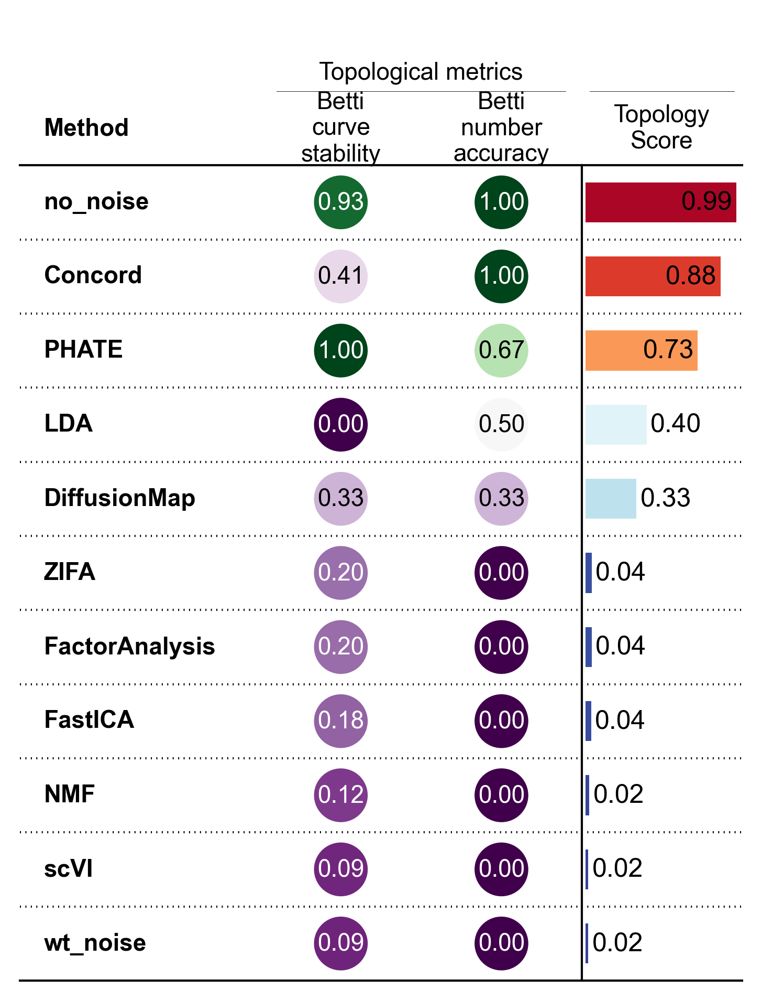

In [15]:
import matplotlib.pyplot as plt
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 8), dpi=300)

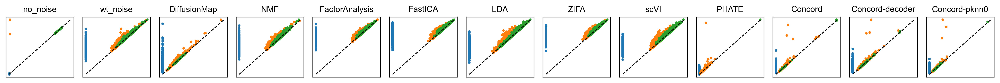

In [140]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('_PCA', ''): diagrams_ordered[key] for key in diagrams_ordered}
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=13, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

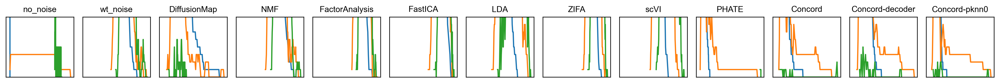

In [142]:
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=13, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

# Geomtric Features 

### Integrated benchmark pipeline

In [12]:
geometry_metrics = ['cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
#groundtruth_key = 'wt_noise'
groundtruth_key = 'no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      ground_truth_dispersion_key='wt_noise',
                                      state_key = leiden_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

Concord - INFO - Computing cell distance correlation


Concord - INFO - Computing local vs distal correlation
Concord - INFO - Computing trustworthiness
Concord - INFO - Computing cluster centroid distances correlation
Concord - INFO - Computing state dispersion correlation


In [13]:
# Simplify the dataframe by computing average for each metric
geometry_df = ccd.ul.simplify_geometry_benchmark_table(geometry_df)
geometry_df = geometry_df.drop(columns=[('Geometric metrics', 'State distance correlation'), ('Geometric metrics', 'State dispersion correlation')]) 
geometry_df

Geometric metrics                
                Cell distance correlation Trustworthiness
no_noise                         1.000000        0.999870
wt_noise                         0.662252        0.949015
DiffusionMap                     0.298821        0.919297
NMF                              0.260795        0.775684
FactorAnalysis                   0.366566        0.839262
FastICA                          0.291616        0.778969
LDA                              0.519253        0.933387
ZIFA                             0.424955        0.867854
scVI                             0.570031        0.930716
PHATE                            0.706817        0.961367
Concord                          0.779691        0.982442
Concord-decoder                  0.778774        0.980899
Concord-pknn0                    0.773283        0.981879

In [14]:
agg_name1 = ''
agg_name2 = 'Geometric Score'
drop_methods = ['Concord-pknn0', 'Concord-decoder']
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=drop_methods), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
geometry_scores


Geometric metrics                                
               Cell distance correlation Trustworthiness Geometric Score
no_noise                        1.000000        0.999870        0.999935
Concord                         0.779691        0.982442        0.881067
PHATE                           0.706817        0.961367        0.834092
wt_noise                        0.662252        0.949015        0.805634
scVI                            0.570031        0.930716        0.750374
LDA                             0.519253        0.933387        0.726320
ZIFA                            0.424955        0.867854        0.646405
DiffusionMap                    0.298821        0.919297        0.609059
FactorAnalysis                  0.366566        0.839262        0.602914
FastICA                         0.291616        0.778969        0.535293
NMF                             0.260795        0.775684        0.518239

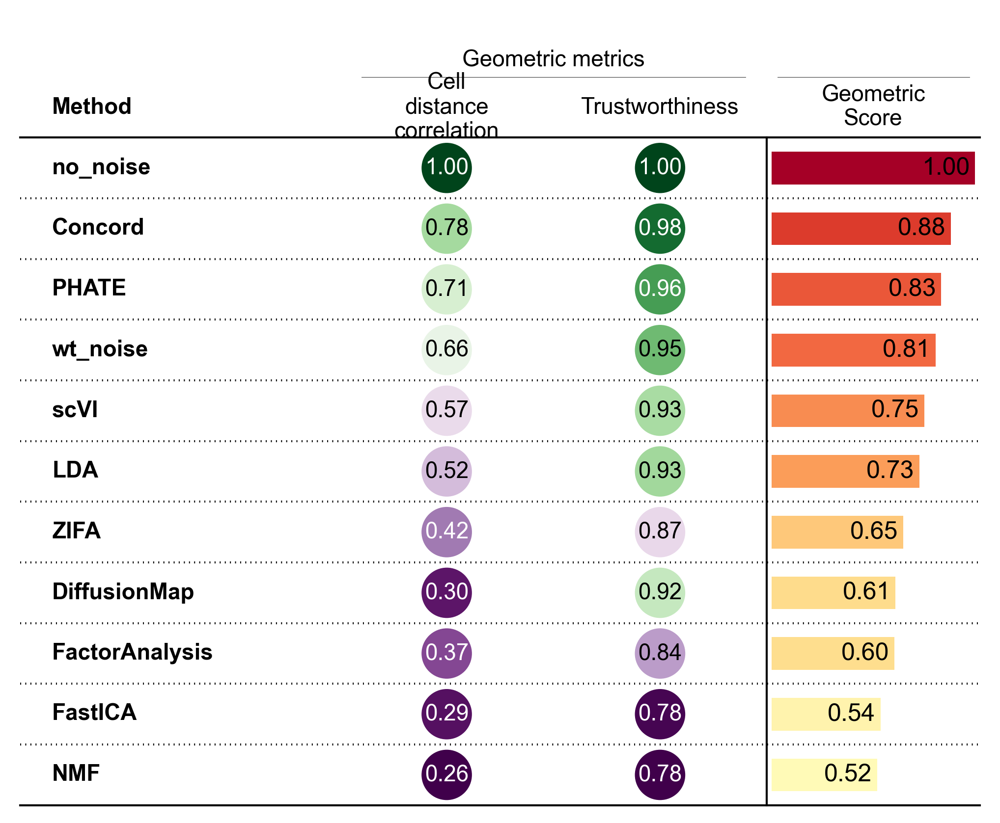

In [27]:
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(8.5, 7), dpi=300)

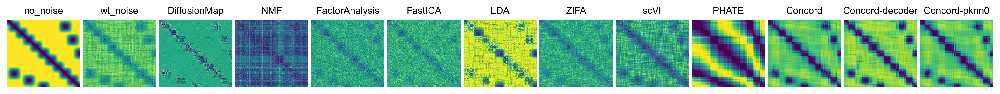

In [191]:
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 13, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.svg")

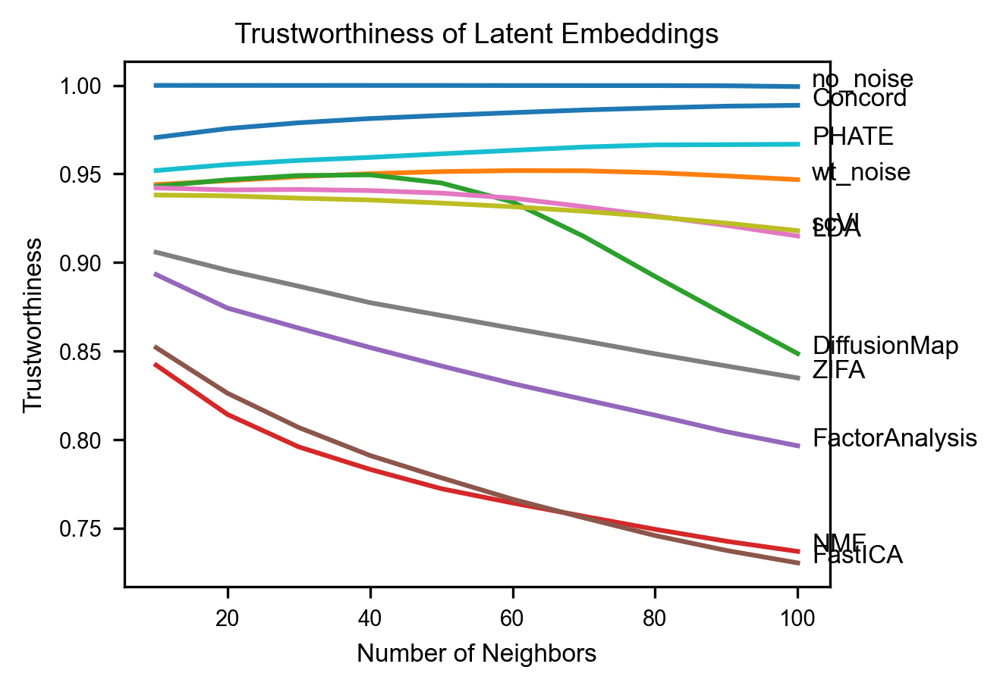

In [167]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
drop_methods = ['Concord-pknn0', 'Concord-decoder']
# Drop row with column 'Embedding' in drop_methods
trustworthiness_scores = trustworthiness_scores[~trustworthiness_scores['Embedding'].isin(drop_methods)]
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=False, save_path=save_dir / f"trustworthiness_{groundtruth_key}_{file_suffix}.pdf", figsize=(4,3))

### Combine all metrics

In [18]:
# Combine all metrics into one table
import pandas as pd
all_scores = pd.concat([topology_scores, geometry_scores], axis=1)
all_scores

Topological metrics                                       \
               Betti curve stability Betti number accuracy Topology Score   
no_noise                    0.925860              1.000000       0.985172   
Concord                     0.412897              1.000000       0.882579   
PHATE                       1.000000              0.666667       0.733333   
LDA                         0.000000              0.500000       0.400000   
DiffusionMap                0.329595              0.333333       0.332586   
ZIFA                        0.202002              0.000000       0.040400   
FactorAnalysis              0.196829              0.000000       0.039366   
FastICA                     0.182190              0.000000       0.036438   
NMF                         0.122514              0.000000       0.024503   
scVI                        0.091715              0.000000       0.018343   
wt_noise                    0.088230              0.000000       0.017646   

                       Geometric metrics                                  
               Cell distance correlation Trustworthiness Geometric Score  
no_noise                        1.000000        0.999870        0.999935  
Concord                         0.779691        0.982442        0.881067  
PHATE                           0.706817        0.961367        0.834092  
LDA                             0.519253        0.933387        0.726320  
DiffusionMap                    0.298821        0.919297        0.609059  
ZIFA                            0.424955        0.867854        0.646405  
FactorAnalysis                  0.366566        0.839262        0.602914  
FastICA                         0.291616        0.778969        0.535293  
NMF                             0.260795        0.775684        0.518239  
scVI                            0.570031        0.930716        0.750374  
wt_noise                        0.662252        0.949015        0.805634

In [19]:
all_scores[('Aggregate score', 'Topology')] = all_scores[('', 'Topology Score')]
all_scores[('Aggregate score', 'Geometry')] = all_scores[('', 'Geometric Score')]
all_scores[('Aggregate score', 'Average Score')] = all_scores["Aggregate score"][["Topology", "Geometry"]].mean(axis=1)
# sort by average score
all_scores.sort_values(by=[('Aggregate score', 'Average Score')], ascending=False, inplace=True)
all_scores.drop(
    columns=[
        ('', 'Topology Score'),
        ('', 'Geometric Score')
    ],
    inplace=True
)
# Save table
all_scores.to_csv(save_dir / f"benchmark_results_{file_suffix}.csv")
all_scores

Topological metrics                        \
               Betti curve stability Betti number accuracy   
no_noise                    0.925860              1.000000   
Concord                     0.412897              1.000000   
PHATE                       1.000000              0.666667   
LDA                         0.000000              0.500000   
DiffusionMap                0.329595              0.333333   
wt_noise                    0.088230              0.000000   
scVI                        0.091715              0.000000   
ZIFA                        0.202002              0.000000   
FactorAnalysis              0.196829              0.000000   
FastICA                     0.182190              0.000000   
NMF                         0.122514              0.000000   

                       Geometric metrics                 Aggregate score  \
               Cell distance correlation Trustworthiness        Topology   
no_noise                        1.000000        0.999870        0.985172   
Concord                         0.779691        0.982442        0.882579   
PHATE                           0.706817        0.961367        0.733333   
LDA                             0.519253        0.933387        0.400000   
DiffusionMap                    0.298821        0.919297        0.332586   
wt_noise                        0.662252        0.949015        0.017646   
scVI                            0.570031        0.930716        0.018343   
ZIFA                            0.424955        0.867854        0.040400   
FactorAnalysis                  0.366566        0.839262        0.039366   
FastICA                         0.291616        0.778969        0.036438   
NMF                             0.260795        0.775684        0.024503   

                                        
                Geometry Average Score  
no_noise        0.999935      0.992554  
Concord         0.881067      0.881823  
PHATE           0.834092      0.783713  
LDA             0.726320      0.563160  
DiffusionMap    0.609059      0.470822  
wt_noise        0.805634      0.411640  
scVI            0.750374      0.384358  
ZIFA            0.646405      0.343402  
FactorAnalysis  0.602914      0.321140  
FastICA         0.535293      0.285865  
NMF             0.518239      0.271371

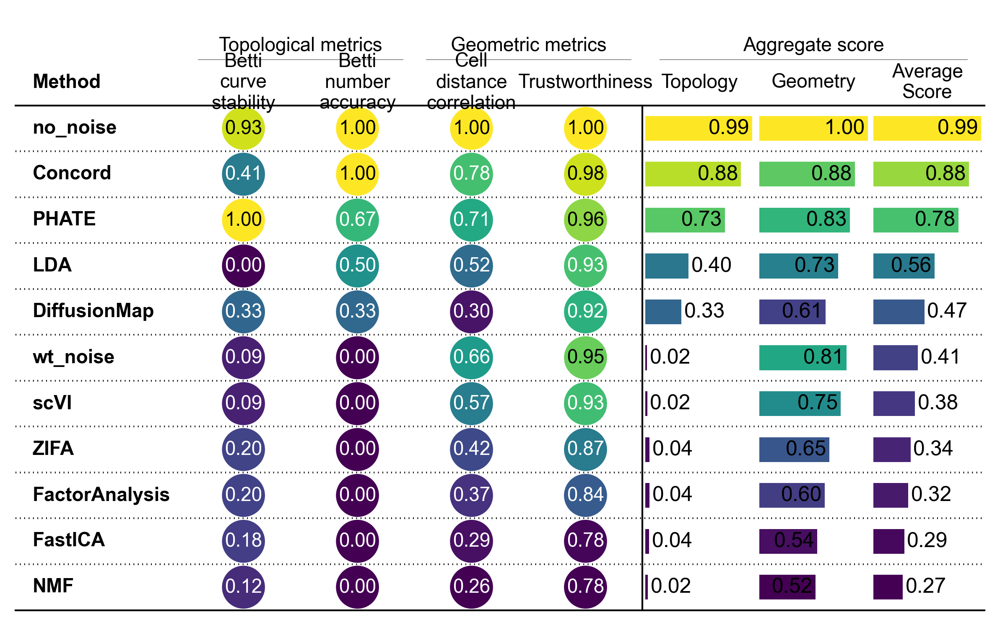

In [20]:
import matplotlib.pyplot as plt
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_benchmark_table(all_scores, pal='viridis', pal_agg='viridis', cmap_method = 'minmax', agg_name = 'Aggregate score', save_path=save_dir / f"all_results_{file_suffix}.pdf", figsize=(10, 6.2), dpi=300)